# Imports :

In [7]:
from CSIKit.reader import get_reader
from CSIKit.util import csitools
from CSIKit.tools.batch_graph import BatchGraph
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from os import listdir
from os.path import isfile, join
from collections import Counter


# All files names : 

In [2]:
mypath = r"test_plate_standart/"
file_names = [f.split(".")[0] for f in listdir(mypath) if isfile(join(mypath, f))]

# Heatmaps :

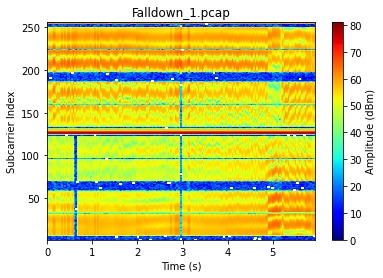

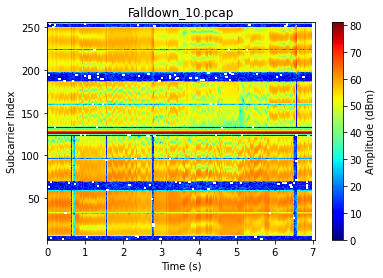

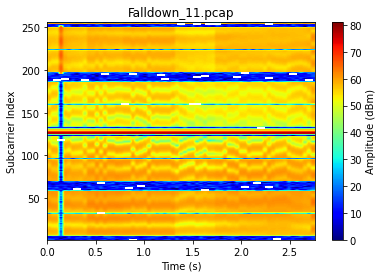

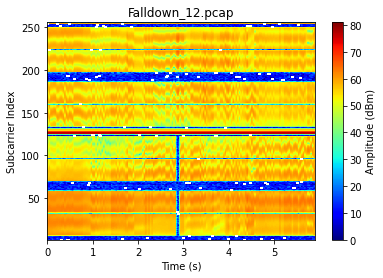

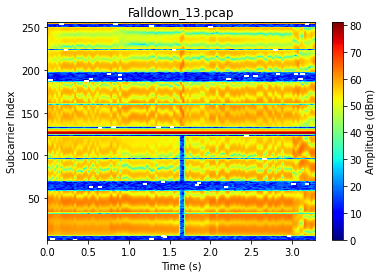

...

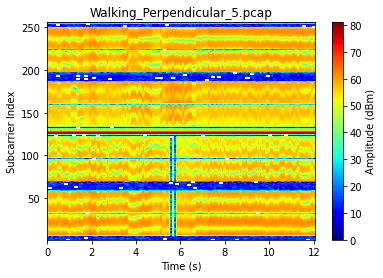

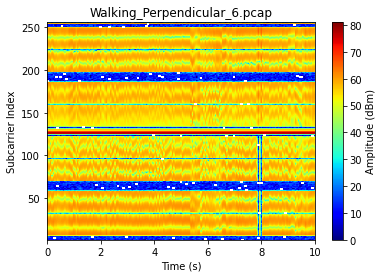

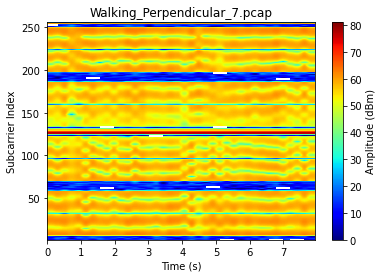

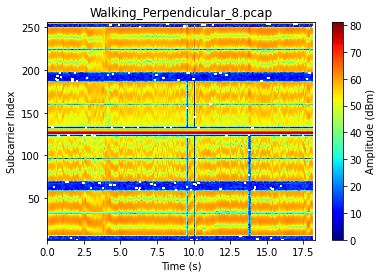

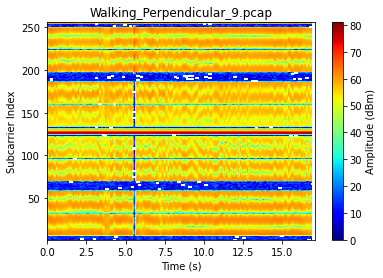

In [3]:
for name in file_names: 
    b = BatchGraph(fr"test_plate_standart/{name}.pcap")
    b.heatmap()

# Plot packets from one file :

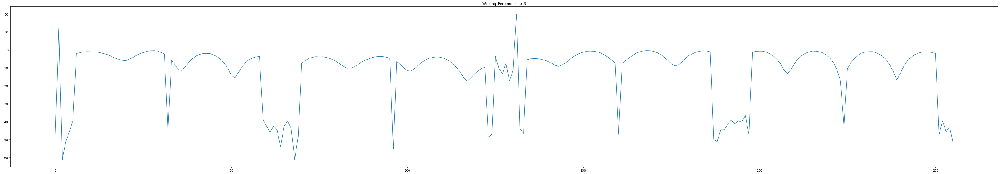

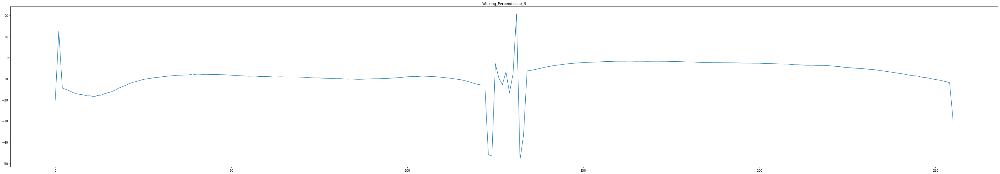

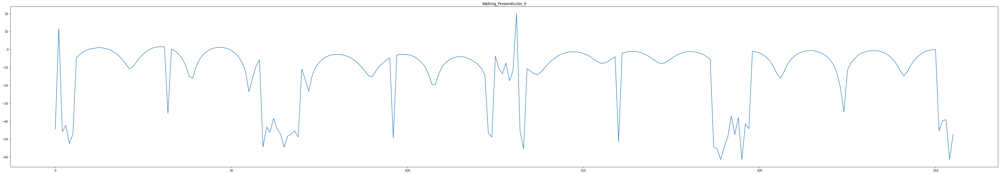

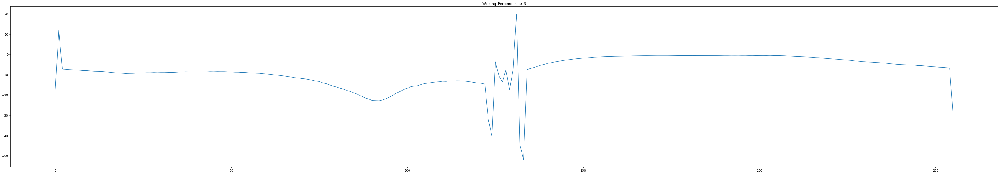

In [11]:
df = pd.read_csv("csv/Hand_move_up_5.csv")
rows,_ = df.shape
for i in range(rows):
    pd.DataFrame(df.iloc[i]).plot.line(ﬁgsize= [60,10], legend=False,title = name)
    
plt.show()

# Correlation Matrix

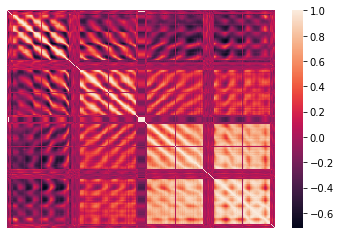

In [5]:
df = pd.read_csv("csv/Falldown_1.csv")
sns.heatmap(df.corr(),xticklabels=False, yticklabels=False)
plt.show()

# File Distribution

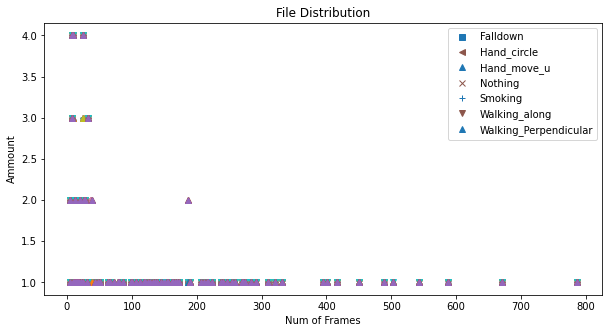

In [8]:
dir_pcap = os.listdir(mypath)
dict_frames = Counter()
number_renders = 0
count_marker = 0
Scolor = ""
marker = ['s', '<', '^', 'x', '+', 'v', '^', '', '>', '', 'd']
plt.figure(figsize=(10, 5))
for i in dir_pcap:
    number_renders += 1
    my_reader = get_reader(fr"test_plate_standart/{i}")
    csi_data = my_reader.read_file(fr"test_plate_standart/{i}",scaled=True)
    csi_phase, no_frames, no_subcarriers = csitools.get_CSI(csi_data)

    if no_frames in dict_frames:
        dict_frames[no_frames] += 1
    else:
        dict_frames[no_frames] = 1

    if number_renders == 1:
        Scolor = marker[count_marker]
        plt.plot(dict_frames.keys(), dict_frames.values(), Scolor,
                 label=f"{i.strip('_1.pcap')}".format(Scolor))

    elif number_renders == 15:
        number_renders = 0
        count_marker += 1
        plt.plot(dict_frames.keys(), dict_frames.values(),Scolor)

    else:

        plt.plot(dict_frames.keys(), dict_frames.values(),Scolor)
    plt.legend(numpoints=1)




plt.xlabel('Num of Frames')
plt.ylabel('Ammount')


plt.title('File Distribution')

plt.show()

# Plot Subcarrier

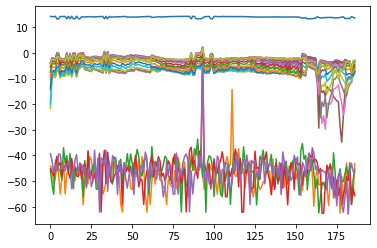

In [12]:
df = pd.read_csv(r"csv/Falldown_1.csv")
rows,colums = df.shape
for i in range(1,20):
    df[f'{i}'].plot.line(legend=False)
plt.show()